# Stain Normalization

In [1]:
import numpy as np
import imp
import math
from re import M
from torch import Tensor
import torch
import numpy as np
from PIL import Image
from torchvision.transforms.functional import to_tensor
from matplotlib import pyplot as plt
import random
%matplotlib widget

In [2]:
import os
import sys

parent = os.path.dirname(os.path.dirname(os.getcwd()))
if parent not in sys.path:
    sys.path.append(parent)

In [3]:
def random_picture(imgs):
    return random.choice(imgs)

def random_pixel(img):
    dim = img.shape
    x,y= random.randint(0,dim[0]-1),random.randint(0,dim[1]-1)
    return img[:,x,y]
    
def random_pixels(max_amt):
    for i in range(max_amt):
        yield random_pixel(random_picture(imgs))
        
def img_pixels(img):
    dim = img.shape
    for x in range(dim[0]):
        for y in range(dim[1]):
            yield img[:,x,y]

In [4]:
def random_sample(tensor,amt):
    return tensor[:,np.random.choice(tensor.shape[1],amt,replace=False)]

In [5]:
def to_hex(rgb):
    return "#{:02x}{:02x}{:02x}".format(rgb[0],rgb[1],rgb[2])

def rgb_color(x,y,z):
    points = torch.stack([x,y,z],dim=0)
    points = (points*256).int().clip(max=255).T
    return [to_hex(points) for points in points]



## Macenko

In [6]:
def normalize_vec(vec: Tensor):
    return vec / vec.norm(p=2, dim=0)


In [7]:
from src.utilities.matplot_utilities import *
from src.utilities.vector_utilities import *
from math import *
def get_stain_vectors(img: Tensor, alpha=0.01, beta=0.15,clipping=4,debug=True):
    """Gets the stain vectors for an image in RGB
        Implemets the Macenko et al. (2016) method for stain normalization.
    Args:
        img (tensor): The RGB H&E image
    """
    flat_img = img.flatten(1, 2)
    # 1) get optical density

    od = -torch.log10(flat_img)

    # 2) prune small intensity (high noise?). Must have at least component above beta
    indices = ((od > beta).nonzero().permute(1, 0))[1]
    od = od[:, indices]
    od = od.clip(0, clipping)  # in case we get infinite point
    
    
    # 3) Get SVD (actually Eigen decomposition of Covariance)

    covmatrix = torch.cov(od)
    
    e, v = torch.linalg.eigh(covmatrix)
    v1, v2 = not_neg(normalize_vec(v[:,2]).float()), not_neg(normalize_vec(v[:,1]).float()) # because v[:,2] is the largest eigenvalue

    assert abs(v1.norm(p=2).item()-1) < 1e-5
    assert abs(v2.norm(p=2).item() - 1) < 1e-5

    assert abs(torch.dot(v1, v2).item()) < 1e-5
    
    
    # TODO DRAW GRAPH 1
    if debug:
        od_sample = random_sample(od,10000)
        xod,yod,zod = od_sample[0],od_sample[1],od_sample[2]
        x,y,z= torch.pow(10,-xod),torch.pow(10,-yod),torch.pow(10,-zod)
        f = plt.figure(figsize=(5,5))
        ax = f.add_subplot(1,1,1,projection='3d')
        ax.scatter3D(xod.numpy(),yod.numpy(),zod.numpy(),c=rgb_color(x,y,z))
        draw_vectors_3d(ax,torch.stack([v1,v2],dim=0),length=0.4,color='b')
        draw_plane(ax,v1,v2,color='b')
        #draw_annotated_vector_3d(ax,v1,(0,0,0),"Eigenvector 1")
        #draw_annotated_vector_3d(ax,v2,(0,0,0),"Eigenvector 2")
        ax.set_xlim(0)
        ax.set_ylim(0)
        ax.set_zlim(0)
        ax.set_xlabel('OD RED')
        ax.set_ylabel('OD GREEN')
        ax.set_zlabel('OD BLUE')
        plt.show()
    
    
    
    
    # 4&5) Project points on the the plane and normalize
    perp = torch.cross(v1, v2).float()
    perp = not_neg(normalize_vec(perp))

    dist = perp @ od
    proj = od - (perp.unsqueeze(1) @ dist.unsqueeze(0))
    proj = normalize_vec(proj)

    assert abs(proj.norm(p=2, dim=0).mean().item() - 1) < 1e-5
    
    # 6) Get angles

    #angles = torch.acos(torch.matmul(v1.T, proj).clip(-1, 1)) #todo clips wrong part! First rotate
    
    offset_angle = torch.pi/2
    rot_proj = rotate_in_plane(proj,perp,offset_angle) # in order to make all vectors in the same area
    angles = torch.acos(torch.matmul(v1.T, rot_proj).clip(-1, 1))
    
    #print(angles.isnan().sum())
    min_ang, max_ang = np.percentile(angles.numpy(), [alpha, 100-alpha])
    min_ang -= offset_angle
    max_ang -= offset_angle
    #print(min_ang,max_ang)
    #print(v1,perp)
    # 7) Get the stain vectors
    stain_v1 = normalize_vec(rotate_in_plane(v1, perp, min_ang))
    stain_v2 = normalize_vec(rotate_in_plane(v1, perp, max_ang))
    

    
    
    # TODO DRAW GRAPH 2
    if debug:
        od_sample = random_sample(od,100000)
        dist_sample = perp @ od_sample
        proj_sample = od_sample - (perp.unsqueeze(1) @ dist_sample.unsqueeze(0))
        norm_proj_sample = normalize_vec(proj_sample)
        
        inverse_basis = torch.linalg.pinv(torch.stack([v1,v2]).T)
        
        components = inverse_basis@ proj_sample
        norm_components = inverse_basis@ norm_proj_sample
        x,y,z= torch.pow(10,-od_sample[0]),torch.pow(10,-od_sample[1]),torch.pow(10,-od_sample[2]) # rgb of the sampled points
        
        sv1_comp,sv2_comp = inverse_basis@stain_v1,inverse_basis@stain_v2
        
        f = plt.figure(figsize=(5,5))
        ax = f.add_subplot(1,1,1)
        ax.scatter(components[0].numpy(),components[1].numpy(),c=rgb_color(x,y,z))
        ax.scatter(norm_components[0].numpy(),norm_components[1].numpy(),c="g")
        draw_vector_2d(ax,sv1_comp*2,color="blue")
        draw_vector_2d(ax,sv2_comp*2,color="blue")
        plt.show()
    

    
    # TODO DRAW GRAPH 3
    if debug:
        od_sample = random_sample(od,10000)
        xod,yod,zod = od_sample[0],od_sample[1],od_sample[2]
        x,y,z= torch.pow(10,-xod),torch.pow(10,-yod),torch.pow(10,-zod)
        
        dist_sample = perp @ od_sample
        proj_sample = od_sample - (perp.unsqueeze(1) @ dist_sample.unsqueeze(0))
        norm_proj_sample = normalize_vec(proj_sample)
        
        f = plt.figure(figsize=(5,5))
        ax = f.add_subplot(1,1,1,projection='3d')
        ax.scatter3D(xod.numpy(),yod.numpy(),zod.numpy(),c=rgb_color(x,y,z))
        draw_vectors_3d(ax,torch.stack([v1,v2],dim=0),length=0.4,color='b')
        draw_plane(ax,v1,v2,color='b')
        
        ax.scatter3D(norm_proj_sample[0].numpy(),norm_proj_sample[1].numpy(),norm_proj_sample[2].numpy(),c='black')
        draw_vectors_3d(ax,torch.stack([stain_v1,stain_v2],dim=0),length=2,color='b')
        ax.set_xlim(0)
        ax.set_ylim(0)
        ax.set_zlim(0)
        ax.set_xlabel('OD RED')
        ax.set_ylabel('OD GREEN')
        ax.set_zlabel('OD BLUE')
        plt.show()
    
    

    
        
    assert abs(stain_v1.norm(p=2).item()-1) < 1e-5
    assert abs(stain_v2.norm(p=2).item()-1) < 1e-5

    
    # Back to RGB----------- NO LEAVE IN OD
    
    #stain_v1, stain_v2 = torch.pow(10,-stain_v1 ), torch.pow(10,-stain_v2 )
   # stain_v1, stain_v2 = normalize_vec(stain_v1), normalize_vec(stain_v2)
    
    
    
    if(stain_v1[0]<stain_v2[0]):
        stain_v1, stain_v2 = stain_v2, stain_v1
    
    return stain_v1, stain_v2




In [8]:
#img = imgs[6]
#get_stain_vectors(img, alpha=0.1,debug=True)

## Challenges

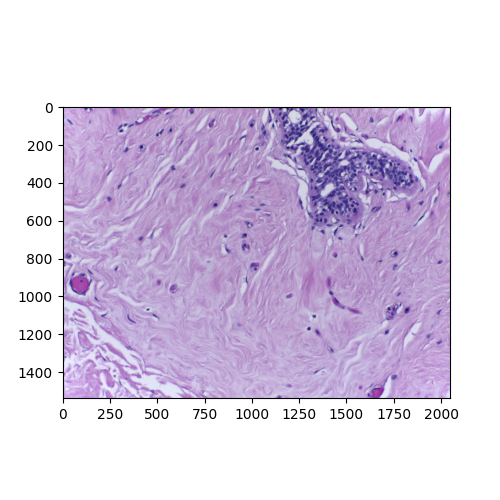

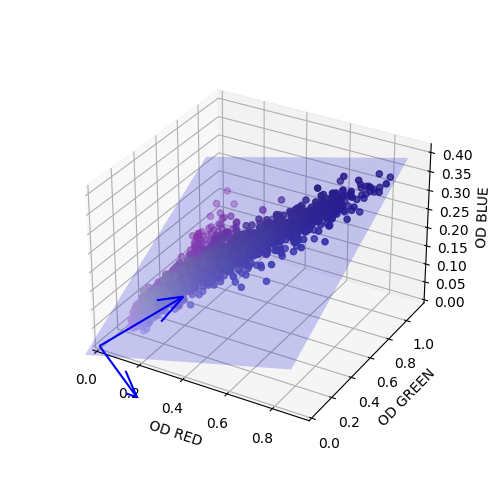

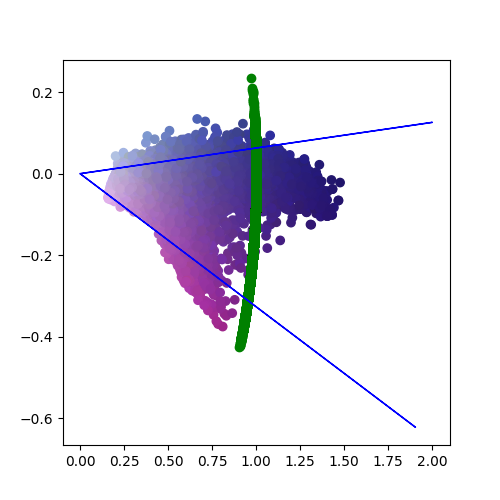

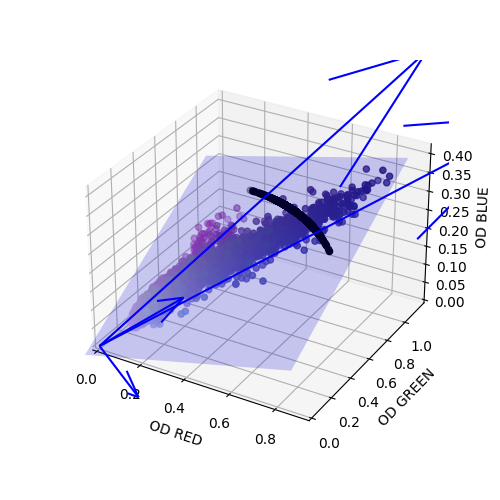

tensor(0.9292)


In [9]:
src_folder = os.path.join(parent,"data","raw","unzipped","BACH_TRAIN","ICIAR2018_BACH_Challenge","Photos")
img_single = to_tensor(Image.open(os.path.join(src_folder,"Benign","b001.tif")))
f = plt.figure(figsize=(5,5))
ax = plt.subplot(1,1,1)
ax.imshow(img_single.permute(1,2,0))
plt.show()

a,b = get_stain_vectors(img_single,debug=True,alpha=0.5)
print(torch.dot(a,b))

In [10]:
print(a,b)

tensor([0.6680, 0.6966, 0.2619]) tensor([0.3510, 0.8992, 0.2614])


## Stain Vectors

In [11]:
from src.transforms.image_processing.he_normalize import get_stain_vectors

Below is a distribution of all the stain vectors in RGB space for BACH dataset + whether the detector would pick up anomoly

100%|██████████| 100/100 [01:25<00:00,  1.17it/s]


([], [])

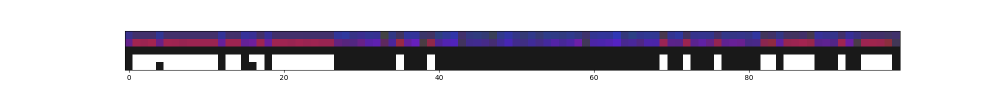

In [12]:
from src.datasets.BACH import BACH
from src.datasets.PanNuke import PanNuke
from tqdm import tqdm
n=100
dataset = BACH(os.path.join(parent,"data","processed","BACH_TRAIN"))
#dataset = PanNuke(os.path.join(parent,"data","processed","PanNuke"))
vectors = []

def detector(v1,v2):
    if torch.dot(v1,v2) > 0.9:
        return torch.ones(3)
    else:
        return torch.zeros(3)

def detector_2(v1,v2,psv):
    standard_v1, standard_v2 = psv
    close1 = torch.dot(v1,standard_v1) > torch.dot(v1,standard_v2)
    close2 = torch.dot(v2,standard_v1) > torch.dot(v2,standard_v2)
    if close1 ^ close2:
        return torch.zeros(3)
    else:
        return torch.ones(3)

for img_path in tqdm(dataset.original_image_paths[:n]):
    img = to_tensor(Image.open(img_path))
#for i in tqdm(range(n)):
#    item = dataset[i]
#    img = item["image"]
    v1,v2 = get_stain_vectors(img,alpha=1)
    vectors += [v1,v2,detector(v1,v2),detector_2(v1,v2,(Tensor([0.7247, 0.6274, 0.2849]),Tensor([0.0624, 0.8357, 0.5456]))),detector_2(v1,v2,(Tensor([0.5850, 0.7193, 0.3748]), Tensor([0.2065, 0.8423, 0.4978]) ))]
    
vectors = np.power(10,-torch.stack(vectors,dim=0).numpy().reshape(5,-1,3,order='F'))

f = plt.figure(figsize=(20,2))
plt.imshow(vectors)
plt.yticks([])

# Normalizing Image

In [13]:
def he_normalize(img):
    v1,v2 = get_stain_vectors(img, alpha=0.01)
    standard_v1,standard_v2 = Tensor([0.7247, 0.6274, 0.2849]),Tensor([0.0624, 0.8357, 0.5456])
    #if abs(v1[0].item()-v2[0].item()) < 0.3 or min(v1[0].item(), v2[0].item()) > 0.30:
    #    return img  # This is for what I call singularly stained images
    old_basis = torch.stack([v1,v2],dim=0).T
    new_basis = torch.stack([standard_v1,standard_v2],dim=0).T
    
    flat_img = img.flatten(1, 2)
    od = (-torch.log10(flat_img)).clip(0, 100)

    new_od = new_basis @ torch.linalg.pinv(old_basis) @ od
    new_od = new_od.unflatten(1, (img.shape[1], img.shape[2])).clip(0, 10)
    rgb = torch.pow(10, -new_od).clip(0, 1)
    return rgb


In [14]:
single_norm = he_normalize(img_single)

Singular
Singular


Text(0.5, 1.0, 'Normalized')

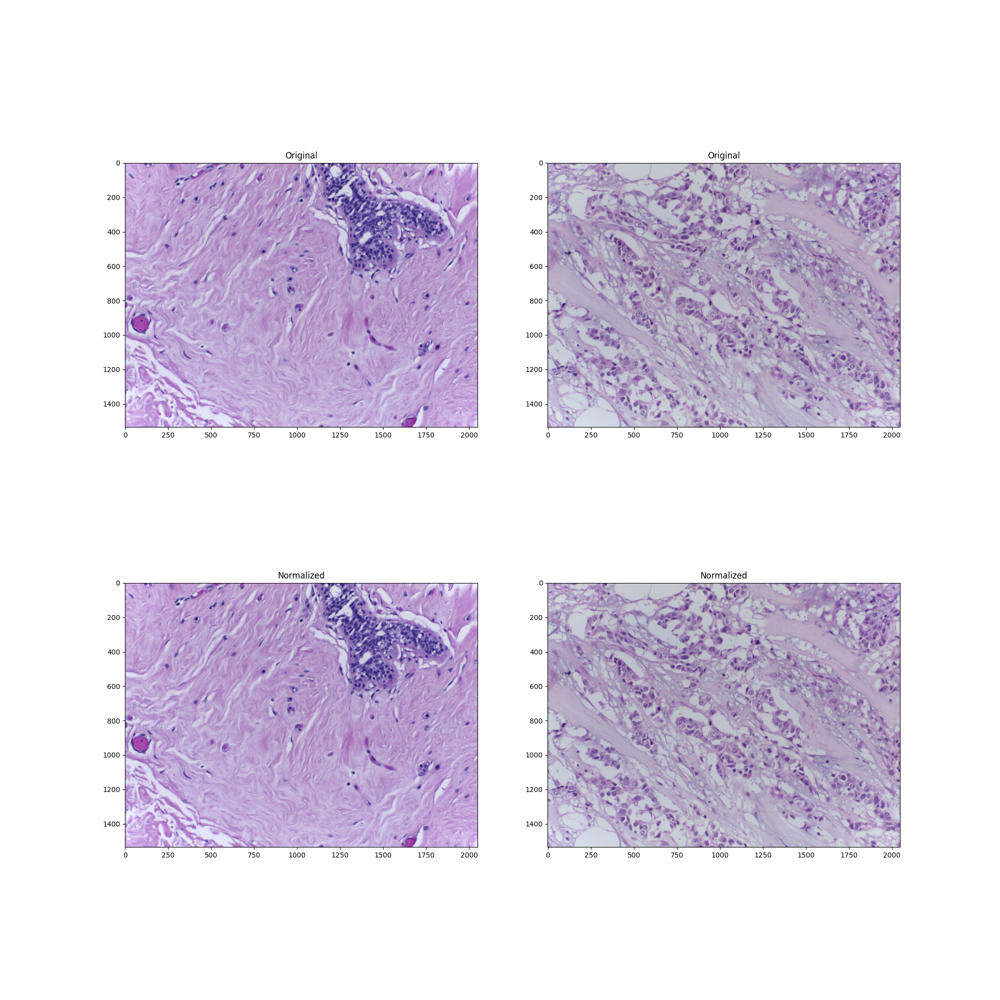

In [15]:
from src.utilities.img_utilities import *
from src.transforms.image_processing.he_normalize import normalize_he_image

src_folder = os.path.join(parent,"data","raw","unzipped","BACH_TRAIN","ICIAR2018_BACH_Challenge","Photos")
img1 = to_tensor(Image.open(os.path.join(src_folder,"Benign","b001.tif")))
img2 = to_tensor(Image.open(os.path.join(src_folder,"Invasive","iv020.tif")))

img1_norm = normalize_he_image(img1)
img2_norm = normalize_he_image(img2)

f = plt.figure(figsize=(20,20))
ax = f.subplots(2,2)
ax[0,0].imshow(tensor_to_numpy(img1))
ax[0,0].set_title('Original')
ax[0,1].imshow(tensor_to_numpy(img2))
ax[0,1].set_title('Original')
ax[1,0].imshow(tensor_to_numpy(img1_norm))
ax[1,0].set_title('Normalized')
ax[1,1].imshow(tensor_to_numpy(img2_norm))
ax[1,1].set_title('Normalized')

# Deconvolve

tensor([[0.6767, 0.6965, 0.2386],
        [0.3561, 0.9017, 0.2453]])


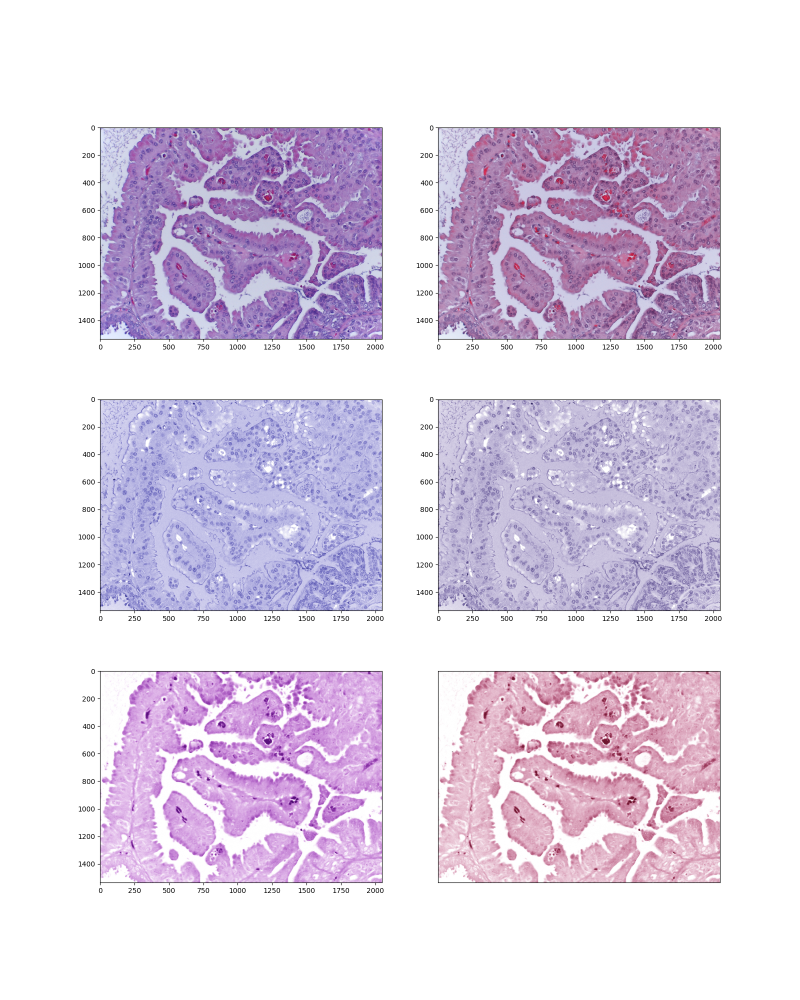

In [17]:
from src.transforms.image_processing.he_normalize import deconvolve_he_image

src_folder = os.path.join(parent,"data","raw","unzipped","BACH_TRAIN","ICIAR2018_BACH_Challenge","Photos")

img = to_tensor(Image.open(os.path.join(src_folder,"Benign","b089.tif")))
img_norm = he_normalize(img)

h,e = deconvolve_he_image(img,alpha=1)
h_norm,e_norm = deconvolve_he_image(img_norm,alpha=1)

f,ax = plt.subplots(3,2,figsize=(16,20))

ax[0,0].imshow(tensor_to_numpy(img))
ax[1,0].imshow(tensor_to_numpy(h))
ax[2,0].imshow(tensor_to_numpy(e))
ax[0,1].imshow(tensor_to_numpy(img_norm))
ax[1,1].imshow(tensor_to_numpy(h_norm))
ax[2,1].imshow(tensor_to_numpy(e_norm))
plt.xticks([])
plt.yticks([])
print(get_stain_vectors(img,alpha=1))

REALLY INTERESTING!!!!! So if the image has shadows, then this may be more informative than the actual stains!!!! b095!!! b048!! iv020, b089


## Citations

- "A Method for Normalizing Hiostology Sliders for Quantitative Analysis" - Macenko et. al
- [Explorative Explanation](https://towardsdatascience.com/microscopy-stain-variations-and-how-to-estimate-them-baca29f57ee9)